# 1 - Importando base de dados

In [136]:
import pandas as pd


In [137]:
dados = pd.read_csv('tips_atualizado.csv')
dados.head()

,total_bill,tip,dessert,day,time,size
0,16.99,1.01,No,Sun,Dinner,2
1,10.34,1.66,No,Sun,Dinner,3
2,21.01,3.50,No,Sun,Dinner,3
3,23.68,3.31,No,Sun,Dinner,2
4,24.59,3.61,No,Sun,Dinner,4


# 2 - Alterando colunas

In [138]:
dados.columns

Index(['total_bill', 'tip', 'dessert', 'day', 'time', 'size'], dtype='object')

In [139]:
renomear={'total_bill':'valor_da_conta', 'tip':'gorjeta', 'dessert':'sobremesa', 'day':'dia_da_semana', 'time':'hora_do_dia', 'size':'total_de_pessoas'}

In [140]:
type(dados)

pandas.core.frame.DataFrame

In [141]:
gorjetas = dados.rename(columns = renomear)

In [142]:
gorjetas

,valor_da_conta,gorjeta,sobremesa,dia_da_semana,hora_do_dia,total_de_pessoas
0,16.990000,1.010000,No,Sun,Dinner,2
1,10.340000,1.660000,No,Sun,Dinner,3
2,21.010000,3.500000,No,Sun,Dinner,3
3,23.680000,3.310000,No,Sun,Dinner,2
4,24.590000,3.610000,No,Sun,Dinner,4
...,...,...,...,...,...,...
3411,26.330845,4.729032,No,Sat,Dinner,3
3412,25.531567,1.604021,Yes,Sat,Dinner,2
3413,21.547132,1.733914,Yes,Sat,Dinner,2
3414,18.966233,1.718951,No,Sat,Dinner,2


In [143]:
gorjetas.sobremesa.unique()

array(['No', 'Yes'], dtype=object)

In [144]:
sim_nao = {'No':'Não','Yes':'Sim'}

In [145]:
gorjetas.sobremesa.map(sim_nao)

0       Não
1       Não
2       Não
3       Não
4       Não
       ... 
3411    Não
3412    Sim
3413    Sim
3414    Não
3415    Não
Name: sobremesa, Length: 3416, dtype: object

In [146]:
gorjetas.sobremesa = gorjetas.sobremesa.map(sim_nao)
gorjetas

,valor_da_conta,gorjeta,sobremesa,dia_da_semana,hora_do_dia,total_de_pessoas
0,16.990000,1.010000,Não,Sun,Dinner,2
1,10.340000,1.660000,Não,Sun,Dinner,3
2,21.010000,3.500000,Não,Sun,Dinner,3
3,23.680000,3.310000,Não,Sun,Dinner,2
4,24.590000,3.610000,Não,Sun,Dinner,4
...,...,...,...,...,...,...
3411,26.330845,4.729032,Não,Sat,Dinner,3
3412,25.531567,1.604021,Sim,Sat,Dinner,2
3413,21.547132,1.733914,Sim,Sat,Dinner,2
3414,18.966233,1.718951,Não,Sat,Dinner,2


In [147]:
gorjetas.sobremesa.unique()

array(['Não', 'Sim'], dtype=object)

In [148]:
gorjetas.dia_da_semana.unique()

array(['Sun', 'Sat', 'Thur', 'Fri'], dtype=object)

In [149]:
dias_da_semana={'Sun':'Domingo', 'Sat':'Sábado', 'Thur':'Quinta', 'Fri':'Sexta'}

In [150]:
gorjetas.dia_da_semana=gorjetas.dia_da_semana.map(dias_da_semana)

In [151]:
gorjetas

,valor_da_conta,gorjeta,sobremesa,dia_da_semana,hora_do_dia,total_de_pessoas
0,16.990000,1.010000,Não,Domingo,Dinner,2
1,10.340000,1.660000,Não,Domingo,Dinner,3
2,21.010000,3.500000,Não,Domingo,Dinner,3
3,23.680000,3.310000,Não,Domingo,Dinner,2
4,24.590000,3.610000,Não,Domingo,Dinner,4
...,...,...,...,...,...,...
3411,26.330845,4.729032,Não,Sábado,Dinner,3
3412,25.531567,1.604021,Sim,Sábado,Dinner,2
3413,21.547132,1.733914,Sim,Sábado,Dinner,2
3414,18.966233,1.718951,Não,Sábado,Dinner,2


In [152]:
gorjetas.hora_do_dia.unique()

array(['Dinner', 'Lunch'], dtype=object)

In [153]:
horas_do_dia = {'Dinner':'Jantar', 'Lunch':'Almoço'}

In [154]:
gorjetas.hora_do_dia= gorjetas.hora_do_dia.map(horas_do_dia)

In [155]:
gorjetas

,valor_da_conta,gorjeta,sobremesa,dia_da_semana,hora_do_dia,total_de_pessoas
0,16.990000,1.010000,Não,Domingo,Jantar,2
1,10.340000,1.660000,Não,Domingo,Jantar,3
2,21.010000,3.500000,Não,Domingo,Jantar,3
3,23.680000,3.310000,Não,Domingo,Jantar,2
4,24.590000,3.610000,Não,Domingo,Jantar,4
...,...,...,...,...,...,...
3411,26.330845,4.729032,Não,Sábado,Jantar,3
3412,25.531567,1.604021,Sim,Sábado,Jantar,2
3413,21.547132,1.733914,Sim,Sábado,Jantar,2
3414,18.966233,1.718951,Não,Sábado,Jantar,2


In [156]:
gorjetas.hora_do_dia.unique()

array(['Jantar', 'Almoço'], dtype=object)

In [157]:
gorjetas.hora_do_dia.value_counts()

Jantar    2464
Almoço     952
Name: hora_do_dia, dtype: int64

# 3 - Importando Seaborn

In [158]:
import seaborn as sns

In [159]:
!pip show seaborn

Name: seaborn
Version: 0.11.0
Summary: seaborn: statistical data visualization
Home-page: https://seaborn.pydata.org
Author: Michael Waskom
Author-email: mwaskom@nyu.edu
License: BSD (3-clause)
Location: c:\users\igors\.conda\envs\alura_pandas\lib\site-packages
Requires: pandas, numpy, matplotlib, scipy
Required-by: 


### Análise 1 - Valor da conta e gorjeta

In [160]:
gorjetas.columns

Index(['valor_da_conta', 'gorjeta', 'sobremesa', 'dia_da_semana',
       'hora_do_dia', 'total_de_pessoas'],
      dtype='object')

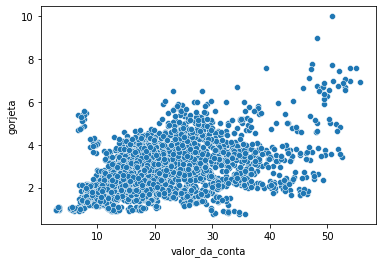

In [161]:
valor_gorjeta = sns.scatterplot(x ='valor_da_conta',y='gorjeta',data=gorjetas)

**Visualmente, o valor da gorjeta aumenta conforme o valor da conta aumenta**

In [162]:
print(f'A base de dados contem {gorjetas.shape[0]} registros')
print(f'Registros não nulos:\n{gorjetas.count()}')

A base de dados contem 3416 registros
Registros não nulos:
valor_da_conta      3416
gorjeta             3416
sobremesa           3416
dia_da_semana       3416
hora_do_dia         3416
total_de_pessoas    3416
dtype: int64


### Criando o campo porcentagem

In [163]:
gorjetas.head()

,valor_da_conta,gorjeta,sobremesa,dia_da_semana,hora_do_dia,total_de_pessoas
0,16.99,1.01,Não,Domingo,Jantar,2
1,10.34,1.66,Não,Domingo,Jantar,3
2,21.01,3.50,Não,Domingo,Jantar,3
3,23.68,3.31,Não,Domingo,Jantar,2
4,24.59,3.61,Não,Domingo,Jantar,4


In [164]:
gorjetas['porcentagem'] = gorjetas.gorjeta / gorjetas.valor_da_conta

In [165]:
gorjetas

,valor_da_conta,gorjeta,sobremesa,dia_da_semana,hora_do_dia,total_de_pessoas,porcentagem
0,16.990000,1.010000,Não,Domingo,Jantar,2,0.059447
1,10.340000,1.660000,Não,Domingo,Jantar,3,0.160542
2,21.010000,3.500000,Não,Domingo,Jantar,3,0.166587
3,23.680000,3.310000,Não,Domingo,Jantar,2,0.139780
4,24.590000,3.610000,Não,Domingo,Jantar,4,0.146808
...,...,...,...,...,...,...,...
3411,26.330845,4.729032,Não,Sábado,Jantar,3,0.179600
3412,25.531567,1.604021,Sim,Sábado,Jantar,2,0.062825
3413,21.547132,1.733914,Sim,Sábado,Jantar,2,0.080471
3414,18.966233,1.718951,Não,Sábado,Jantar,2,0.090632


In [166]:
gorjetas.porcentagem = gorjetas.porcentagem.round(2)

In [167]:
gorjetas

,valor_da_conta,gorjeta,sobremesa,dia_da_semana,hora_do_dia,total_de_pessoas,porcentagem
0,16.990000,1.010000,Não,Domingo,Jantar,2,0.06
1,10.340000,1.660000,Não,Domingo,Jantar,3,0.16
2,21.010000,3.500000,Não,Domingo,Jantar,3,0.17
3,23.680000,3.310000,Não,Domingo,Jantar,2,0.14
4,24.590000,3.610000,Não,Domingo,Jantar,4,0.15
...,...,...,...,...,...,...,...
3411,26.330845,4.729032,Não,Sábado,Jantar,3,0.18
3412,25.531567,1.604021,Sim,Sábado,Jantar,2,0.06
3413,21.547132,1.733914,Sim,Sábado,Jantar,2,0.08
3414,18.966233,1.718951,Não,Sábado,Jantar,2,0.09


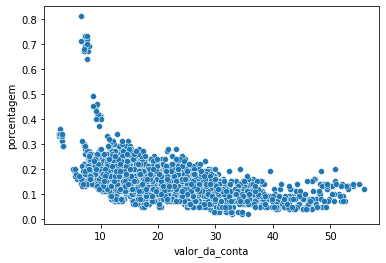

In [168]:
porcentagem_conta = sns.scatterplot(x='valor_da_conta',y='porcentagem',data=gorjetas)

** Visualmente, o valor da conta não é proporcional ao valor da gorjeta. **

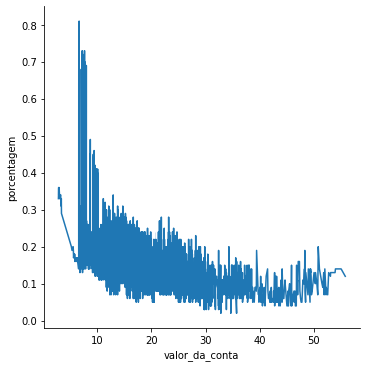

In [169]:
porcentagem_conta_linha = sns.relplot(x='valor_da_conta',y='porcentagem', kind = 'line',data=gorjetas)

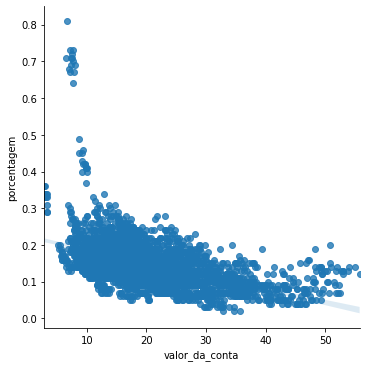

In [170]:
sns.lmplot(x='valor_da_conta',y='porcentagem',data=gorjetas)

# Análise 2 - Sobremesa

In [171]:
gorjetas[gorjetas.sobremesa=='Sim'].describe()

,valor_da_conta,gorjeta,total_de_pessoas,porcentagem
count,1302.000000,1302.000000,1302.000000,1302.000000
mean,20.800076,2.710137,2.408602,0.153425
std,9.901358,1.162280,0.806690,0.088961
min,2.799644,0.766203,1.000000,0.020000
25%,13.495501,1.911661,2.000000,0.090000
50%,17.917059,2.434354,2.000000,0.150000
75%,26.807493,3.326298,3.000000,0.190000
max,55.804318,10.000000,5.000000,0.810000


In [172]:
gorjetas[gorjetas.sobremesa=='Não'].describe()

,valor_da_conta,gorjeta,total_de_pessoas,porcentagem
count,2114.000000,2114.000000,2114.000000,2114.000000
mean,19.223436,2.711837,2.668874,0.150033
std,8.316030,1.024271,1.014848,0.044248
min,6.533329,0.910509,1.000000,0.040000
25%,13.281977,1.931135,2.000000,0.120000
50%,17.736923,2.608222,2.000000,0.150000
75%,22.749482,3.284578,3.000000,0.180000
max,53.091371,9.000000,6.000000,0.330000


In [173]:
gorjetas.describe()

,valor_da_conta,gorjeta,total_de_pessoas,porcentagem
count,3416.000000,3416.000000,3416.000000,3416.000000
mean,19.824368,2.711189,2.569672,0.151326
std,8.984716,1.078789,0.949288,0.065032
min,2.799644,0.766203,1.000000,0.020000
25%,13.388590,1.919737,2.000000,0.110000
50%,17.800015,2.549192,2.000000,0.150000
75%,24.331401,3.292833,3.000000,0.180000
max,55.804318,10.000000,6.000000,0.810000


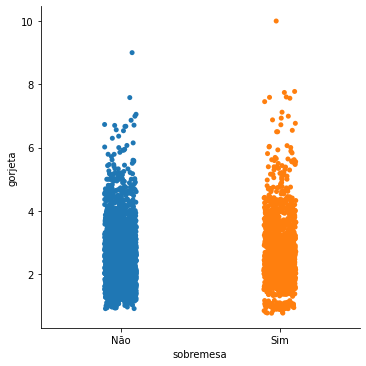

In [174]:
sns.catplot(x='sobremesa',y='gorjeta',data=gorjetas)

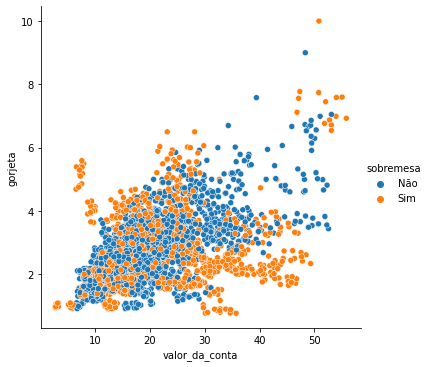

In [175]:
sns.relplot(x='valor_da_conta',y='gorjeta',hue='sobremesa',data=gorjetas)

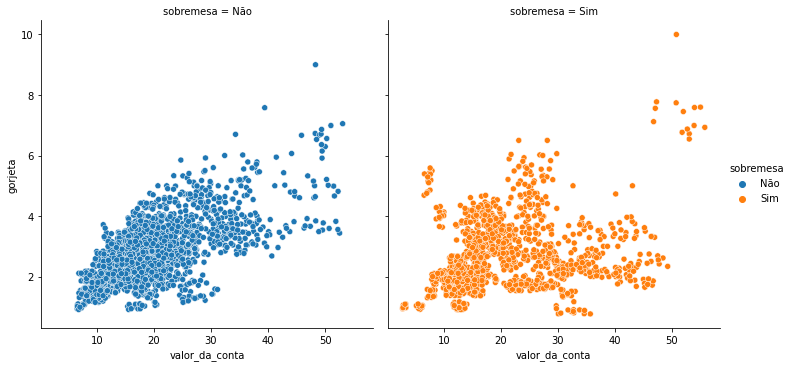

In [176]:
sns.relplot(x='valor_da_conta',y='gorjeta',hue='sobremesa',col='sobremesa',data=gorjetas)

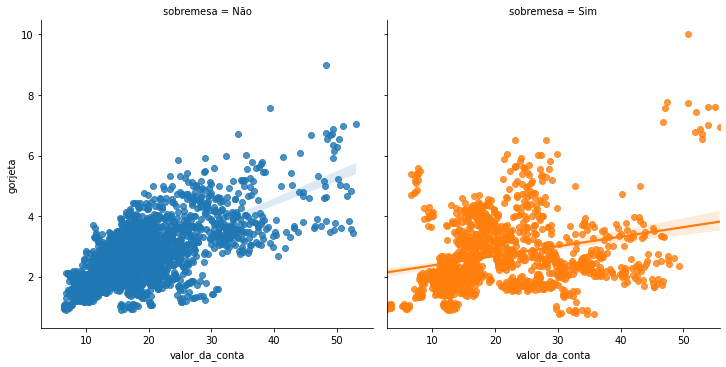

In [177]:
sns.lmplot(x='valor_da_conta',y='gorjeta',col = 'sobremesa',hue='sobremesa',data=gorjetas)

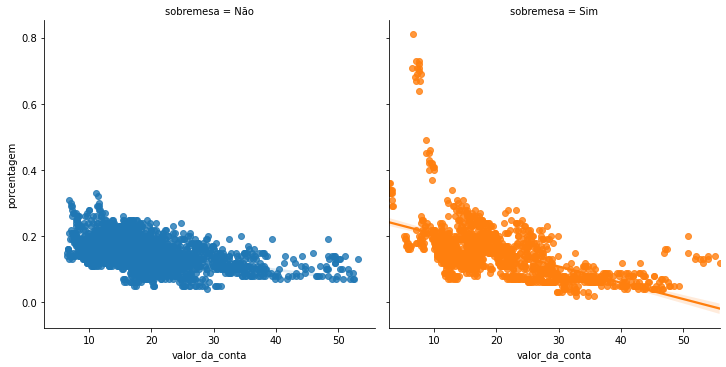

In [178]:
sns.lmplot(x='valor_da_conta',y='porcentagem',col='sobremesa',hue='sobremesa',data=gorjetas)

**Visualmente existe uma diferença no valor das gorjetas de quem pediu sobremesa**

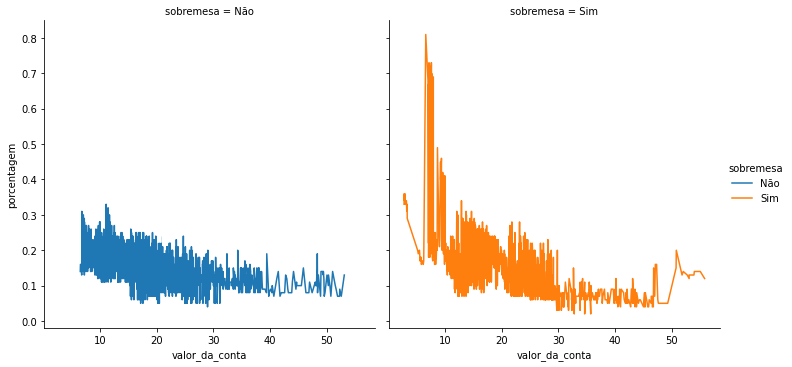

In [179]:
sns.relplot(x='valor_da_conta',y='porcentagem',kind='line',hue='sobremesa',col='sobremesa',data=gorjetas)

In [180]:
gorjetas.head()

,valor_da_conta,gorjeta,sobremesa,dia_da_semana,hora_do_dia,total_de_pessoas,porcentagem
0,16.99,1.01,Não,Domingo,Jantar,2,0.06
1,10.34,1.66,Não,Domingo,Jantar,3,0.16
2,21.01,3.50,Não,Domingo,Jantar,3,0.17
3,23.68,3.31,Não,Domingo,Jantar,2,0.14
4,24.59,3.61,Não,Domingo,Jantar,4,0.15


# Teste de hipótese
**H<sup>null</sup>** <br>
** A distribuição  da taxa da gorjeta é a mesama nos 2 grupos** <br><br><br>
**H<sup>alt</sup>** <br>
** A distribuição  da taxa da gorjeta não é a mesama nos 2 grupos**<br>


In [181]:
from scipy.stats import ranksums

In [182]:
sobremesa = gorjetas.query('sobremesa == "Sim"').porcentagem
sem_sobremesa = gorjetas.query('sobremesa=="Não"').porcentagem

In [183]:
r = ranksums(sobremesa,sem_sobremesa)

In [184]:
print(f'O valor do p-value é {r.pvalue}')

O valor do p-value é 0.033144013617673405


** A distribuição  da taxa da gorjeta é a mesama nos 2 grupos** <br><br><br>

In [185]:
gorjetas.head()

,valor_da_conta,gorjeta,sobremesa,dia_da_semana,hora_do_dia,total_de_pessoas,porcentagem
0,16.99,1.01,Não,Domingo,Jantar,2,0.06
1,10.34,1.66,Não,Domingo,Jantar,3,0.16
2,21.01,3.50,Não,Domingo,Jantar,3,0.17
3,23.68,3.31,Não,Domingo,Jantar,2,0.14
4,24.59,3.61,Não,Domingo,Jantar,4,0.15


# Análise 3 Dia da semana

In [186]:
gorjetas.dia_da_semana.unique()

array(['Domingo', 'Sábado', 'Quinta', 'Sexta'], dtype=object)

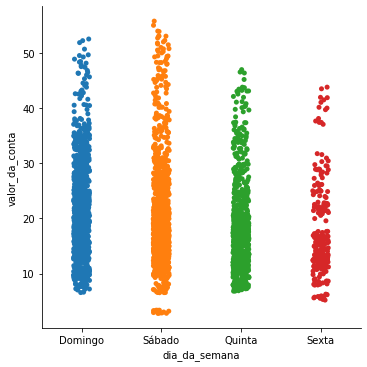

In [187]:
sns.catplot(x='dia_da_semana',y='valor_da_conta', data=gorjetas)

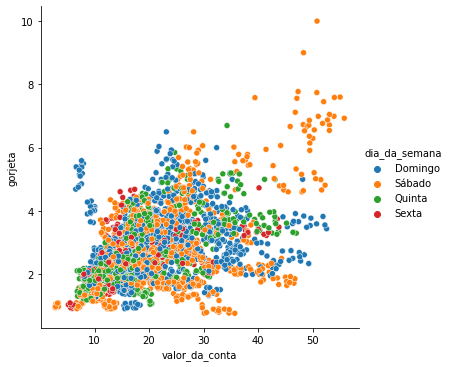

In [188]:
sns.relplot(x='valor_da_conta',y='gorjeta',hue='dia_da_semana',data=gorjetas)

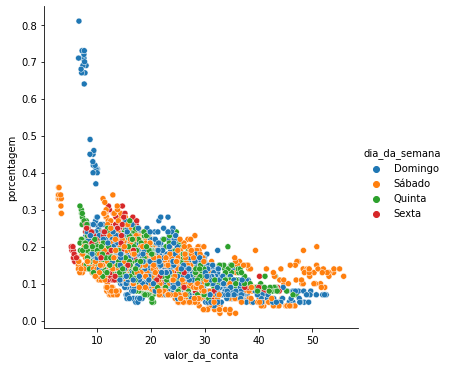

In [189]:
sns.relplot(x='valor_da_conta',y='porcentagem',hue='dia_da_semana',data=gorjetas)

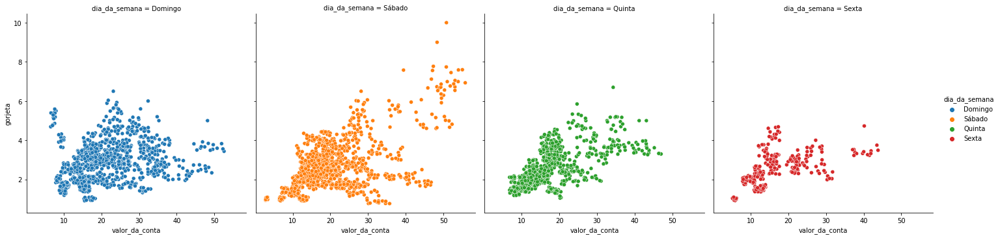

In [190]:
sns.relplot(x='valor_da_conta',y='gorjeta',hue='dia_da_semana',col='dia_da_semana',data=gorjetas)

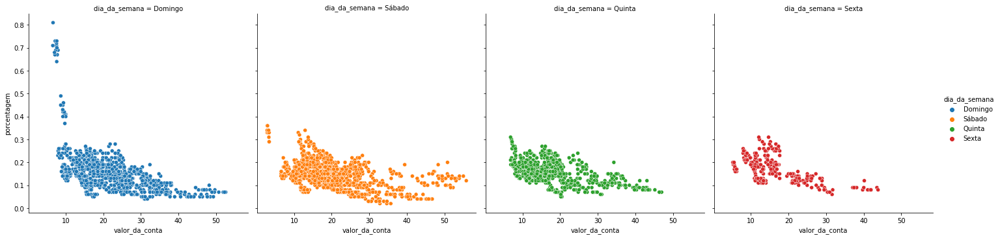

In [191]:
sns.relplot(x='valor_da_conta',y='porcentagem',hue='dia_da_semana',col='dia_da_semana',data=gorjetas)

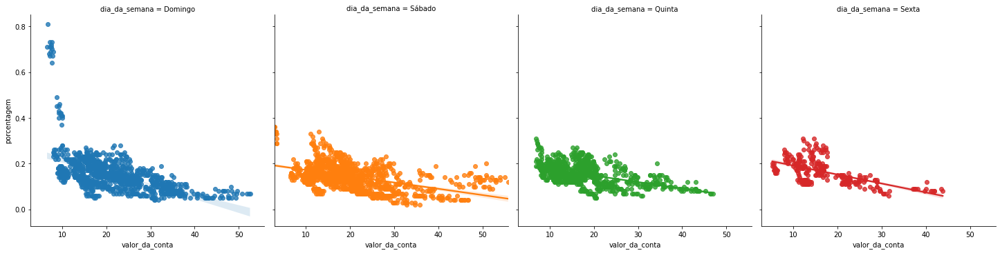

In [192]:
sns.lmplot(x='valor_da_conta',y='porcentagem',hue='dia_da_semana',col='dia_da_semana',data=gorjetas)

In [193]:
media_geral_gorjetas = gorjetas.gorjeta.mean()

In [194]:
print(f'A média geral das gorjetas é de {media_geral_gorjetas.round(2)}')

A média geral das gorjetas é de 2.71


In [195]:
gorjetas.groupby(['dia_da_semana']).mean()[['valor_da_conta','gorjeta','porcentagem']]

,valor_da_conta,gorjeta,porcentagem
dia_da_semana,,,
Domingo,21.439133,2.902079,0.154953
Quinta,17.724088,2.556177,0.154090
Sexta,17.215616,2.549960,0.163158
Sábado,20.480249,2.690114,0.143604


In [196]:
print(f'Frequência dos dias:')
gorjetas.dia_da_semana.value_counts()

Frequência dos dias:


Sábado     1218
Domingo    1064
Quinta      868
Sexta       266
Name: dia_da_semana, dtype: int64

## Teste de hipótese

**H<sup>null</sup><br>
**A distribuição do valor da conta é igual no sábado e no domingo <br><br>
**H<sup>alt</sup><br>
**A distribuição do valor da conta é diferente no sábado e no domingo <br><br>




In [197]:
valor_conta_domingo = gorjetas.query('dia_da_semana=="Domingo"').valor_da_conta

In [198]:
valor_conta_sabado = gorjetas.query('dia_da_semana == "Sábado"').valor_da_conta


In [199]:
r2 = ranksums(valor_conta_sabado,valor_conta_domingo)
print(f'O valor do p-value é {r2.pvalue}')

O valor do p-value é 0.0004435935681441821


** A distribuição do valor da conta é igual no sábado e no domingo

In [200]:
gorjetas.head()

,valor_da_conta,gorjeta,sobremesa,dia_da_semana,hora_do_dia,total_de_pessoas,porcentagem
0,16.99,1.01,Não,Domingo,Jantar,2,0.06
1,10.34,1.66,Não,Domingo,Jantar,3,0.16
2,21.01,3.50,Não,Domingo,Jantar,3,0.17
3,23.68,3.31,Não,Domingo,Jantar,2,0.14
4,24.59,3.61,Não,Domingo,Jantar,4,0.15


In [201]:
gorjetas.hora_do_dia.unique()

array(['Jantar', 'Almoço'], dtype=object)

# Análise 4 - Hora do dia

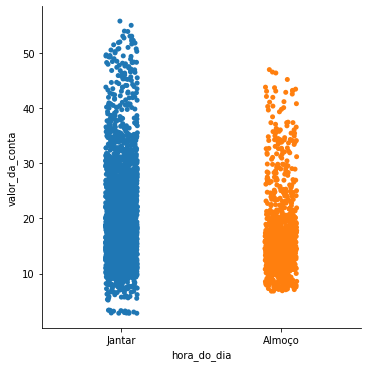

In [202]:
sns.catplot(x='hora_do_dia',y='valor_da_conta',data=gorjetas)

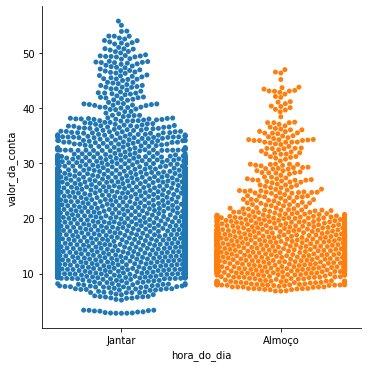

In [203]:
sns.catplot(x='hora_do_dia',y='valor_da_conta',data=gorjetas,kind='swarm')

<AxesSubplot:xlabel='hora_do_dia', ylabel='valor_da_conta'>

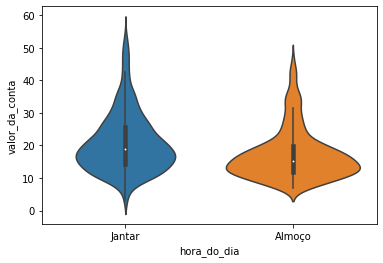

In [204]:
sns.violinplot(x='hora_do_dia',y='valor_da_conta',data=gorjetas)

<AxesSubplot:xlabel='hora_do_dia', ylabel='valor_da_conta'>

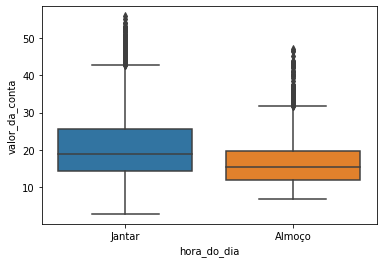

In [205]:
sns.boxplot(x='hora_do_dia',y='valor_da_conta',data=gorjetas)

In [206]:
almoco = gorjetas.query('hora_do_dia == "Almoço"').valor_da_conta

<AxesSubplot:xlabel='valor_da_conta', ylabel='Density'>

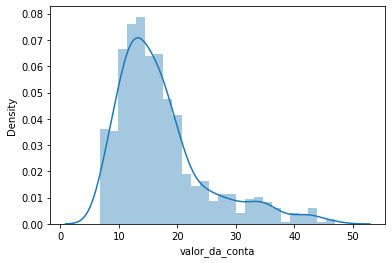

In [207]:
sns.distplot(almoco)

<AxesSubplot:xlabel='valor_da_conta'>

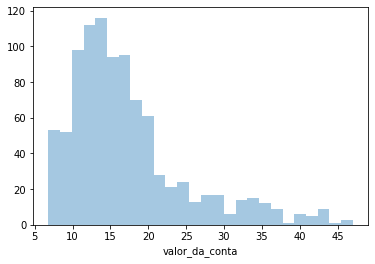

In [208]:
sns.distplot(almoco,kde=False)

In [209]:
jantar = gorjetas.query('hora_do_dia=="Jantar"').valor_da_conta

<AxesSubplot:xlabel='valor_da_conta', ylabel='Density'>

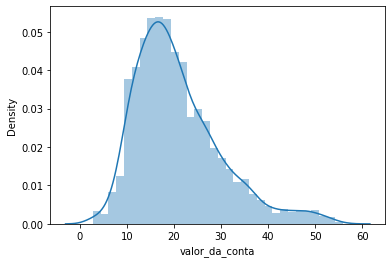

In [210]:
sns.distplot(jantar)

<AxesSubplot:xlabel='valor_da_conta'>

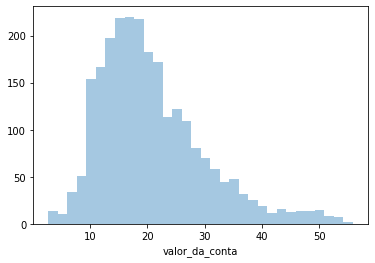

In [211]:
sns.distplot(jantar,kde=False)

In [212]:
gorjetas.groupby(['hora_do_dia']).mean()[['valor_da_conta','gorjeta','porcentagem']]


,valor_da_conta,gorjeta,porcentagem
hora_do_dia,,,
Almoço,17.213913,2.534495,0.157668
Jantar,20.832954,2.779458,0.148876


## Teste de hipótese

**H<sup>null</sup><br>
**A distribuição do valor da conta é igual no jantar e no almoço <br><br>
**H<sup>alt</sup><br>
**A distribuição do valor da conta é diferente no jantar e no almoço <br><br>


In [213]:
valor_da_conta_almoço = gorjetas.query('hora_do_dia=="Almoço"').valor_da_conta
valor_da_conta_almoço

77      27.200000
78      22.760000
79      17.290000
80      19.440000
81      16.660000
          ...    
3394     8.057385
3395    16.753736
3396    13.334323
3397    15.724707
3398    10.730000
Name: valor_da_conta, Length: 952, dtype: float64

In [214]:
valor_da_conta_jantar = gorjetas.query('hora_do_dia=="Jantar"').valor_da_conta
valor_da_conta_jantar

0       16.990000
1       10.340000
2       21.010000
3       23.680000
4       24.590000
          ...    
3411    26.330845
3412    25.531567
3413    21.547132
3414    18.966233
3415    18.079740
Name: valor_da_conta, Length: 2464, dtype: float64

In [215]:
r3=ranksums(valor_da_conta_almoço,valor_da_conta_jantar)
r3

RanksumsResult(statistic=-12.158511455786174, pvalue=5.169201062207143e-34)

In [216]:
print(f'O valor do p-value é {r3.pvalue}')

O valor do p-value é 5.169201062207143e-34


** A distribuição do valor da conta é diferente no jantar e no almoço <br><br> **


## Teste de hipótese

**H<sup>null</sup><br>
**A distribuição do taxa da gorjeta é igual no jantar e no almoço <br><br>
**H<sup>alt</sup><br>
**A distribuição do taxa da gorjeta é diferente no jantar e no almoço <br><br>


In [217]:
porcentagem_almoço = gorjetas.query('hora_do_dia=="Almoço"').porcentagem

In [218]:
porcentagem_jantar = gorjetas.query('hora_do_dia=="Jantar"').porcentagem

In [219]:
r4 = ranksums(porcentagem_almoço,porcentagem_jantar)

In [220]:
print(f'O valor do p-value é {r4.pvalue}')

O valor do p-value é 1.3785725618355523e-11


** A distribuição do taxa da gorjeta é igual no jantar e no almoço <br><br> **